# Flux analysis with TurbulenceFlux.jl

### Tips for non Julia users

 - to install `julia` follow the informations at [https://julialang.org/downloads/](https://julialang.org/downloads/) 
 - to launch this notebook, you require Jupyter and a Julia kernel, the `IJulia` package automatises this process, see [here](https://github.com/JuliaLang/IJulia.jl).
 - to install `TurbulenceFlux.jl` simply use `import Pkg;Pkg.add("TurbulenceFlux")`, this notebook also requires additional packages see the commented lines just below
 - to write unicode characters in Julia such as β (in code edition or prompt mode) use backslash followed by the beginning of the name of the character (here `beta`) to get a list of corresponding unicode characters
 - documentation about a particular function can be displayed by prepending the function with a question mark, e.g. `?map`

In [1]:
using TurbulenceFlux

In [2]:
# Uncomment next line for installing dependencies specific to this notebook
#
#import Pkg;Pkg.add(["CairoMakie","DelaunayTriangulation","Colors","ColorSchemes","Measurements","Unitful","LaTeXStrings","Printf","FFTW","KernelDensity","StatsBase","Statistics","LinearAlgebra","JLD2","DataFrames"])
include("plotrecipes_nb.jl");

## Data Loading

### Data Samples

Some data samples are made available at https://drive.proton.me/urls/VM51CC7Y6G#q9ykofXnuqys. 
To run the notebook on the data: download it and put the file under `data/` at the root directory of this package.

In [3]:
using JLD2
using DataFrames
file=jldopen("../data/data_sample.jld2")
days=collect(keys(file))
d=days[1]
data=file[d]
close(file)
println(d)

2022-06-15


**Global parameters**

In [4]:
fs=20 # Sampling Frequency (Hz)
displacement_height = 14.7 # Displacement Height (m)
instrument_height = 30.75 # Measurement Height
canopy_height = 21.5 # Height of canopy forest
roughness_length = 4.05;

In [5]:
work_dim=length(data["Signals"].Date)
time_h=(0:(work_dim-1))
time_h=time_h ./ (60*60*fs)
xticks=0:2:24
xtickformat=h_format
sampling_1min=1:60*fs:work_dim;
sampling_30min=1:30*60*fs:work_dim;
## SAMPLING STEP
Δt=1*60*fs # 1 min Sampling Step

1200

## Checking Signals

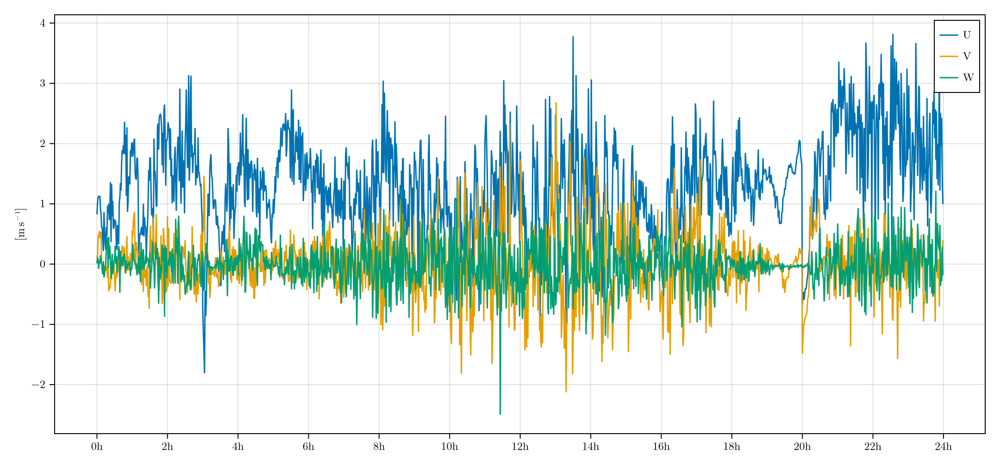

In [6]:
plot_speeds(data["Signals"];xticks,xtickformat)

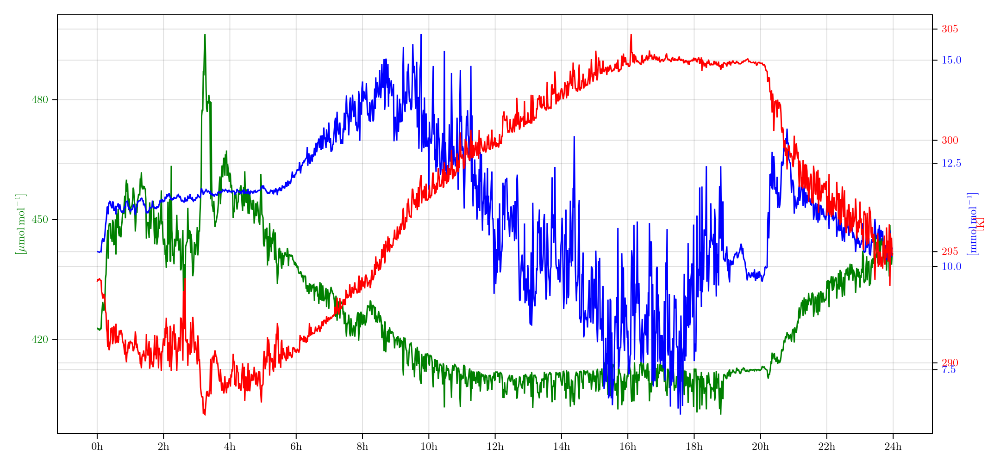

In [7]:
plot_scalars(data["Signals"];xticks,xtickformat)

In [8]:
(;H_UNCORR,LE_UNCORR,FC_UNCORR) = data["EddyProFlux"];
H_UNCORR=Float64.(H_UNCORR)
LE_UNCORR=Float64.(LE_UNCORR)
FC_UNCORR=Float64.(FC_UNCORR)
time_EP = time_h[sampling_30min] .+ 15*60*fs/work_dim # Center each 30min frames of flux estimation from eddypro at 15min

0.010416666666666666:0.5:23.510416666666668

In [9]:
(;U,V,W,T,CO2,H2O,P)=data["Signals"];
# some conversions
T=T .+ 274.15 # °C TO K
P=1000*P; # kPa to Pa
wind_speeds = hcat(U,V,W);

## **Time-Scale Decomposition**

### **Choosing appropriate time-scale decomposition parameters**
  - The frame of wavelets to decompose signals in time-scale space is initialized with `init_wave_conv_kernel`. 
  - The averaging kernel used to estimate local fluxes in time is initialized with `init_averaging_conv_kernel`.
  - For choosing the parameters see the documentation: `?init_wave_conv_kernel` and `?init_averaging_conv_kernel`

In [10]:
kernel_dim = work_dim # max time support
time_params = (
    kernel_type = :gaussian, # Gaussian type kernel
    kernel_dim, 
    kernel_params = [4*Δt/kernel_dim], # Ratio of max time support.
    Δt,       # 1min time sampling
    );

In [11]:
wave_dim = work_dim
scale_params = (
    β = 2, # First wavelet shape parameter
    γ = 3, # Second wavelet shape parameter
    J = floor(Int,log2(wave_dim)), # Number of octaves
    Q = 4, # Number of inter-octaves
    fmin = 2*fs/(wave_dim), # Minimum frequency peak
    fmax = fs/2, # Maximum Frequency peak
    fs = fs,
    wave_dim, # max time support
    );

### **Playground and Visualisation**

#### **Wavelets frame**
 Visualising the effect of wavelet parameters (play with $β$, $γ$, $w_{min}$ !).
 
 - Note that a low_pass filter with a frequency peak at $w=0$ is constructed
 - The wavelets time deviations and wavelets frequency peaks are given in the arrays `σ_waves` and `freq_peak`.

In [12]:
wave_dim_test = 6*60*60*fs
scale_params_test = (
    β = 2, # First wavelet shape parameter
    γ = 3, # Second wavelet shape parameter
    J = floor(Int,log2(work_dim)), # Number of octaves
    Q = 4, # Number of inter-octaves
    fmin = 1*fs/wave_dim_test, # Minimum frequency peak
    fmax = fs/2, # Maximum Frequency peak
    fs = fs,
    wave_dim = wave_dim_test, # 6h of max time support
    );
(freq_peaks,σ_waves),wave_params,WaveC = init_wave_conv_kernel(work_dim;scale_params_test...,with_sigma=true)
println("Number of filters: $(size(wave_params,2))")
u = div(work_dim,2)
δ_dirac = circshift(vcat(1,zeros(work_dim-1)),u) # need to add a phase
waves = WaveC(δ_dirac,wave_params)
waves = circshift(waves,-u);

Number of filters: 71


##### **Visualisation of Wavelets in time**

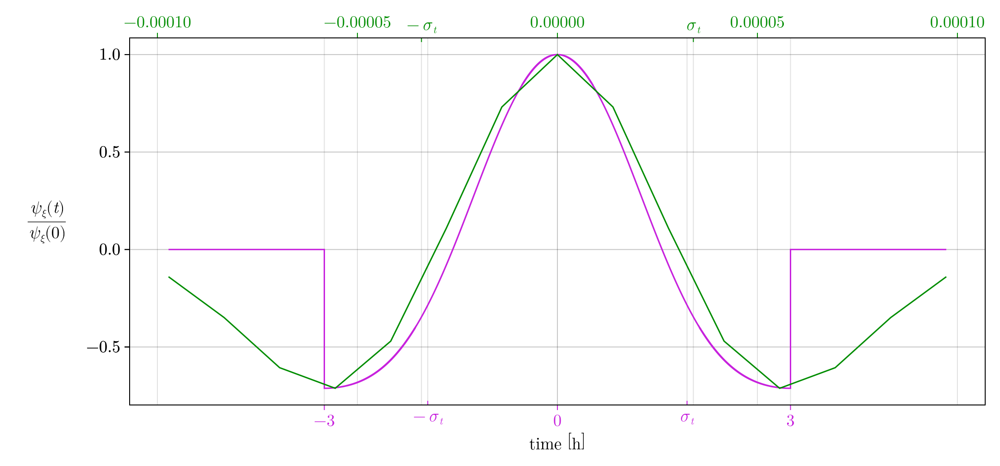

In [13]:
f=plot_wave(σ_waves[end-1],waves[:,end-1])
plot_wave(σ_waves[10],waves[:,10],f=f)

##### **Visualisation of Wavelets in frequency**

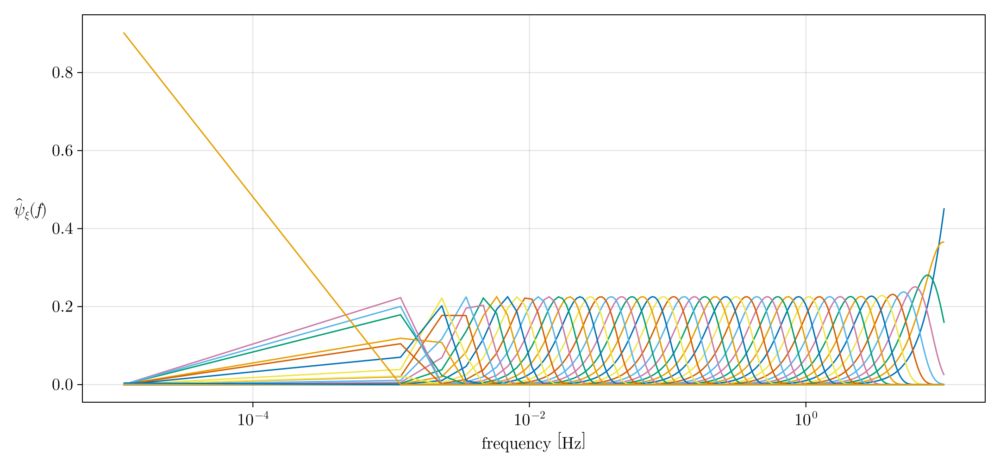

In [14]:
plot_waves_fft(waves)

##### **Properties of this wavelet frame**
 - energy sum to one
 - combined energy spectrum approximate a constant spectrum (dirac function)

In [15]:
energy = sum(abs2,waves)
isapprox(energy,1)

true

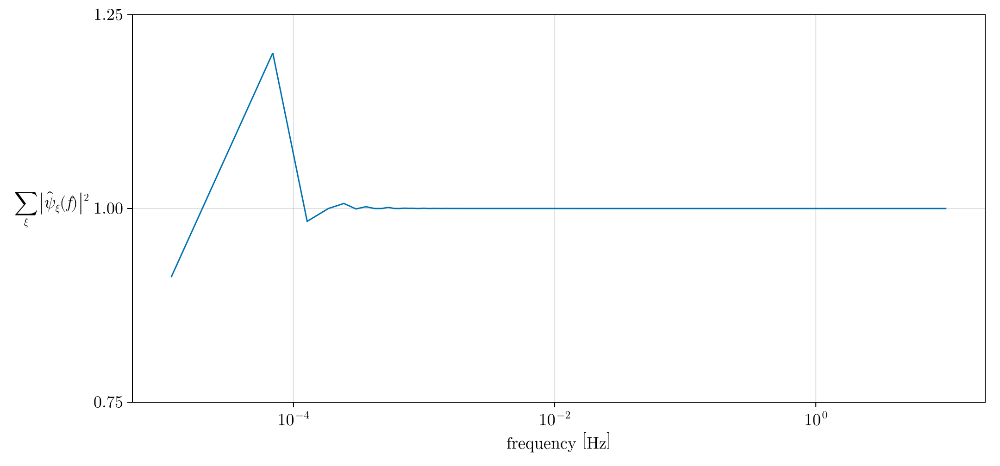

In [16]:
plot_sum_waves_fft(waves)

#### **Averaging kernel**

In [17]:
kernel_dim_test = 6*60*60*fs
Δt_test = 60*fs # 1min time sampling
time_params_test = (
    kernel_type = :gaussian, # Gaussian type kernel
    kernel_dim = kernel_dim_test, 
    kernel_params = [6*Δt_test/kernel_dim_test], # Ratio of max time support. Gaussian reaches 0.6 at 1h
    Δt = Δt_test,       
    );

In [18]:
(time_sampling,σ_averaging),kernel_params,KernelC = init_averaging_conv_kernel((work_dim,1);time_params_test...,with_sigma=true);

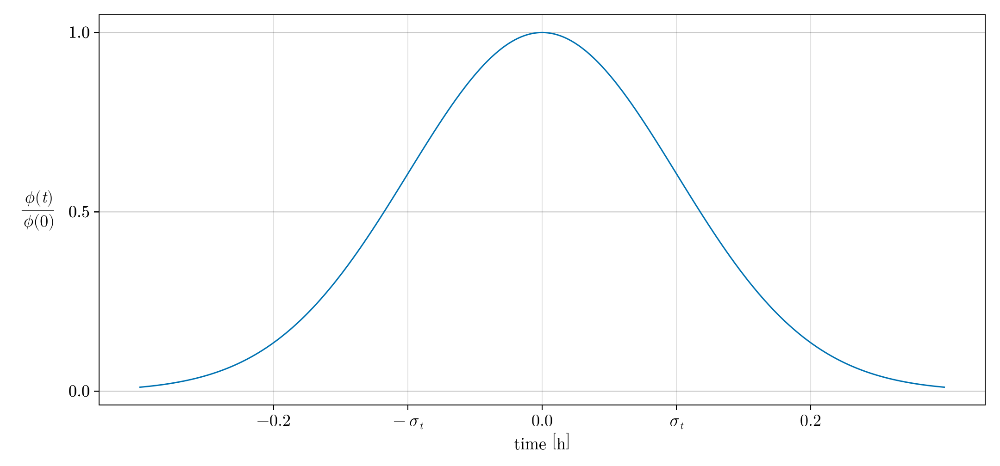

In [19]:
plot_averaging_kernel(KernelC,kernel_params)

##### **Properties of the averaging kernel**
 - Compact, positive and sum to one

In [20]:
sum(KernelC.kernel_func(KernelC,kernel_params))

1.0

### **Cross-Correlation analysis and Timelag optimisation**

In [21]:
τ_max=3*fs # 3sec max timelag search
freq_r = (0.1,10) # In which band of frequency to search for desync
τ_arr,corr_H2O=optim_timelag(W,H2O,scale_params,freq_r,τ_max)
_,corr_CO2=optim_timelag(W,CO2,scale_params,freq_r,τ_max)
# For T and U it should be zero
#_,corr_T=optim_timelag(W,T,scale_params,freq_r,τ_max)
#_,corr_U=optim_timelag(W,U,scale_params,freq_r,τ_max)
_,corr_W=optim_timelag(W,W,scale_params,freq_r,τ_max)

([-60, -59, -58, -57, -56, -55, -54, -53, -52, -51  …  50, 51, 52, 53, 54, 55, 56, 57, 58, 59], [-8387.969386568006, -8338.810094546543, -8251.564447459896, -8186.318790145342, -8145.306514092259, -8094.557021816339, -8037.149422195206, -7947.622593667238, -7848.1501415270495, -7736.947512731528  …  -7599.086175877421, -7736.947512731529, -7848.1501415270495, -7947.62259366724, -8037.149422195207, -8094.557021816339, -8145.30651409226, -8186.318790145344, -8251.5644474599, -8338.810094546543])

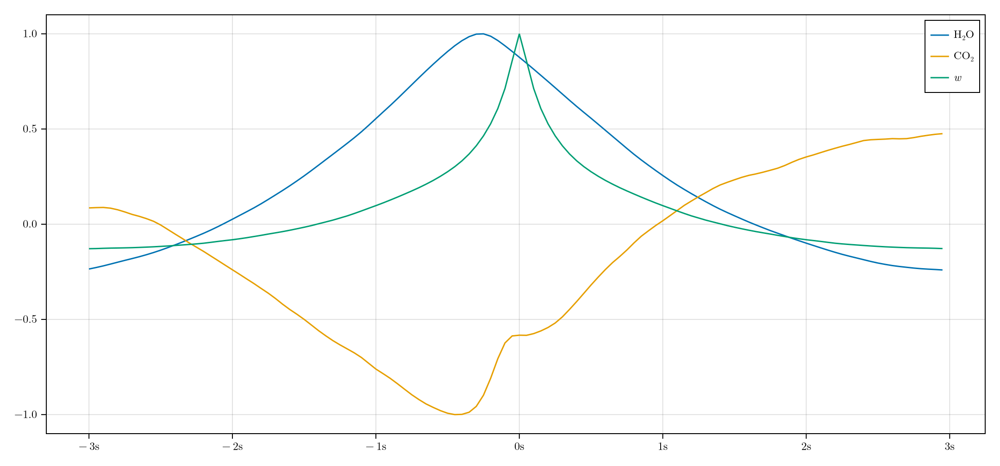

In [22]:
fig=Figure()
ax=Axis(fig[1,1],xtickformat=s_format,xticks=-3:3)
lines!(ax,τ_arr/fs,corr_H2O./maximum(abs.(corr_H2O)),label=getlabel(:H2O,with_units=false))
lines!(ax,τ_arr/fs,corr_CO2./maximum(abs.(corr_CO2)),label=getlabel(:CO2,with_units=false))
#lines!(ax,τ_arr/fs,corr_T./maximum(abs.(corr_T)),label=getlabel(:Ta,with_units=false))
#lines!(ax,τ_arr/fs,corr_U./maximum(abs.(corr_U)),label=L"u")
lines!(ax,τ_arr/fs,corr_W./maximum(abs.(corr_W)),label=L"w")
axislegend(ax)
fig

#### **Timelag correction**

In [23]:
timelags = Dict(
    :H2O => τ_arr[argmax(abs.(corr_H2O))],
    :CO2 => τ_arr[argmax(abs.(corr_CO2))])
H2O_tlcorr=circshift(H2O,timelags[:H2O])
CO2_tlcorr=circshift(CO2,timelags[:CO2])
max_tl = max(abs(timelags[:H2O]),abs(timelags[:CO2]));

**Prepare mean wind amplitude signal and density**

In [24]:
time_params_mean_wind = (
    kernel_type = :gaussian, # Gaussian type kernel
    kernel_dim, 
    kernel_params = [60*Δt/kernel_dim], # Ratio of max time support
    Δt,       # 1min time sampling
    );
mean_wind = compute_wind_amplitude(wind_speeds,time_params_mean_wind);

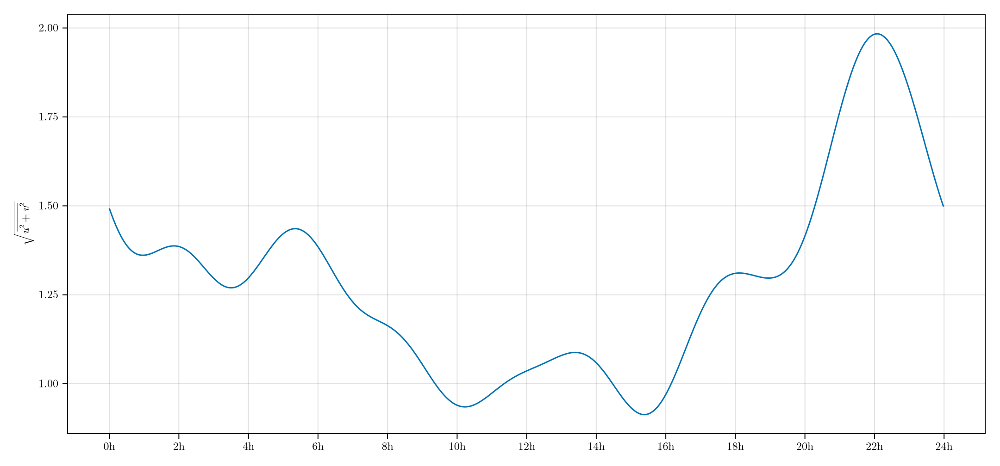

In [25]:
f = Figure()
ax = Axis(f[1,1];xlabel="",ylabel=L"\sqrt{\overline{u^2 + v^2}}",xticks,xtickformat)
lines!(ax,time_h[time_sampling],mean_wind)
f

**Prepare density signal**

In [26]:
time_params_density = (
    kernel_type = :gaussian, # Gaussian type kernel
    kernel_dim, # 6h of max time support
    kernel_params = [60*Δt/kernel_dim], # Ratio of max time support. Gaussian reaches 0.6 at 4*Δt
    Δt,
    );
density = compute_density(P,T,time_params_density);

### **Decomposition of fluxes in time and frequency (time vs scales)**

In [27]:
time_sampling,(freq_peak,σ_t),decomp_T = timescale_flux_decomp(W,T,time_params,scale_params;with_info=true);

In [28]:
_,_,decomp_CO2 = timescale_flux_decomp(W,CO2_tlcorr,time_params,scale_params);

In [29]:
_,_,decomp_H2O = timescale_flux_decomp(W,H2O_tlcorr,time_params,scale_params);

#### **Conversion to flux units**

In [30]:
decomp_T,units_T = tofluxunits(decomp_T,density,:SensibleHeat)
decomp_CO2,units_CO2 = tofluxunits(decomp_CO2,density,:CO2)
decomp_H2O,units_H2O = tofluxunits(decomp_H2O,density,:LatentHeat)

([-3.148737952498925e-5 7.836502859688469e-6 … -1.0511312908584678 548.0483619489265; -5.412081863881239e-7 4.5514783672545915e-5 … -1.1231532596044667 546.2205778157759; … ; -7.817575019381008e-5 -7.244914504700256e-5 … -0.9038041146631534 551.5777309264677; -6.132998319115202e-5 -3.583868681517713e-5 … -0.9780085601293045 549.8342081667971], J m^-2 s^-1)

#### **Cone of errors due to convolutions**

Convolutions errors are present on the borders of the analysis period, thus a mask is defined to flag this values. It is based on the time-deviation of the filters.

In [31]:
σ_t = (σ_t[1] .+ max_tl,σ_t[2]) # add maximum timelag estimated as border error 

([9.550941319345938, 9.457274715389461, 9.495858775031442, 9.678378079788677, 9.877000204359987, 10.092573909208863, 10.34797768344861, 10.651809237571824, 11.01424634904464, 11.447004484845554  …  53857.6677767894, 63849.24197471758, 75487.888777626, 88857.73269078843, 104041.20389171419, 121518.40965402866, 143071.07615987913, 172260.1137940418, 211660.8436864821, 115819.79614882807], 4800.0)

In [32]:
factor=(4,4) # taking 4σ_t
max_sigma=false
mask_σ_t = get_timescale_mask(work_dim,σ_t...,factor,max_sigma)[time_sampling,:];

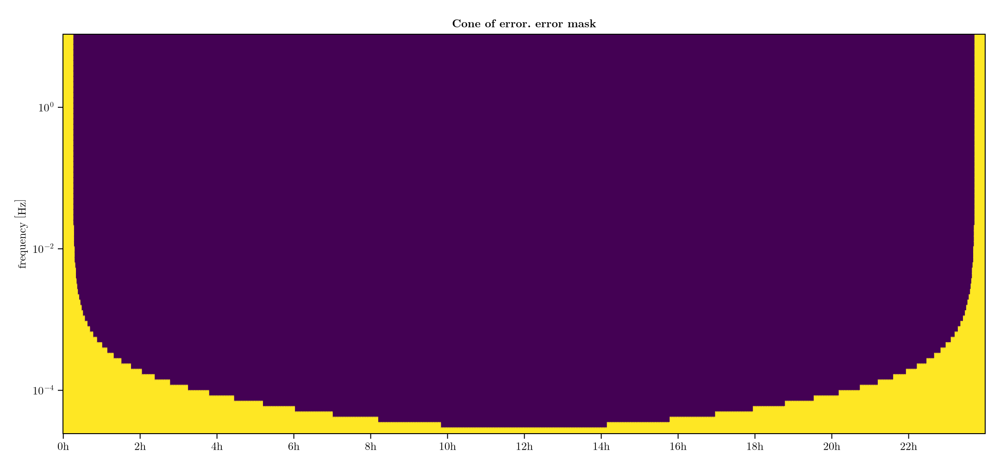

In [33]:
f = Figure()
Axis(f[1,1],yscale=log10,title="Cone of error. error mask";xticks,xtickformat,ylabel=getlabel(:freq))
heatmap!(time_h[time_sampling],freq_peak[1:(end-1)],mask_σ_t[:,1:(end-1)])
f

#### **Normalized frequency/scale**

In the following we take into account the amplitude of the mean wind $\overline{u}(t)$ and form the normalized frequency:

 $$\eta(t,f)=\frac{(z-d)f}{\overline{u}(t)}$$

 where $(z-d)$ is the aerodynamic height and $f$ the frequency peak of the filter (wavelet)

In [34]:
## Visualisation with normalized frequency
ref_dist = instrument_height - displacement_height # displacement height defined at the beginning
to_η(i_t,j_ξ) = log10((ref_dist*freq_peak[j_ξ])/mean_wind[i_t]); # ∼ log(ref_dist/eddy_dim)
S = (length(time_sampling),length(freq_peak)) # Dimension
CI = CartesianIndices(S)

tref = map(c->time_h[time_sampling[c[1]]],CI) # get the time values
ηref = map(c->to_η(c[1],c[2]),CI) # get the normalized scale
# note that the first frequency band corresponding to the low-pass is removed, hence the `1:end-1`
# the triangulation is done once and used for subsequent visualisation of the fluxes

mask = trues(S...)
mask_nomean = copy(mask)
mask_nomean[:,end] .= false
t=vec(tref[mask_nomean])
η=vec(ηref[mask_nomean]);

In [35]:
# DO IT ONCE for the given (t,η) coordinates
tri = make_constrained_triangulation(t,η,(length(time_sampling),length(freq_peak)-1))

Delaunay Triangulation.
   Number of vertices: 107999
   Number of triangles: 212966
   Number of edges: 320963
   Has boundary nodes: true
   Has ghost triangles: true
   Curve-bounded: false
   Weighted: false
   Constrained: true

#### **Visualisation of the time-frequency decomposed fluxes**

In [36]:
decomp_T=decomp_T[mask_nomean]
decomp_CO2=decomp_CO2[mask_nomean]
decomp_H2O=decomp_H2O[mask_nomean]
mask_σ_t=mask_σ_t[mask_nomean];

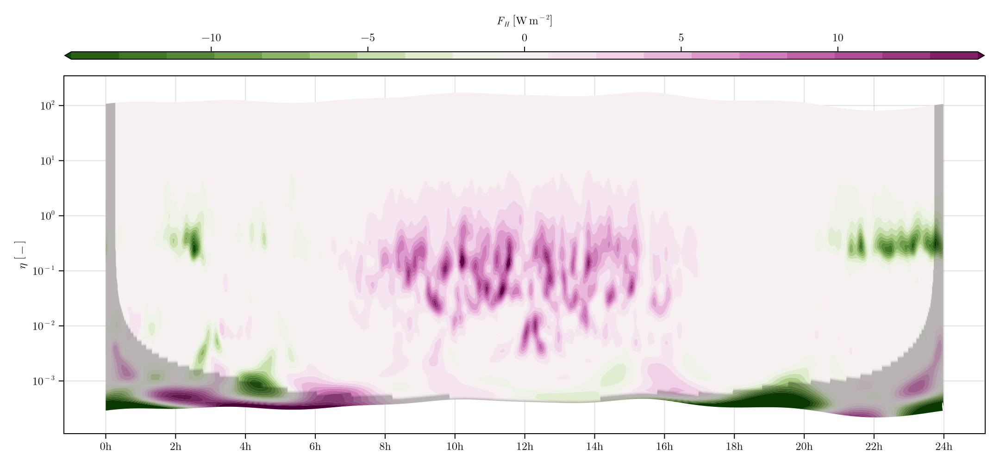

In [37]:
fig = Figure()
σ_F = std(decomp_T)
plot_time_eddyscale!(
    fig,
    t,
    η,
    decomp_T,
    ;xticks,xtickformat,
    label_z = getlabel(:SensibleHeat),
    vmin = -4*σ_F,
    vmax = 4*σ_F,
    mask = mask_σ_t,
    xlabel="",title = "",tri=tri,
)
fig

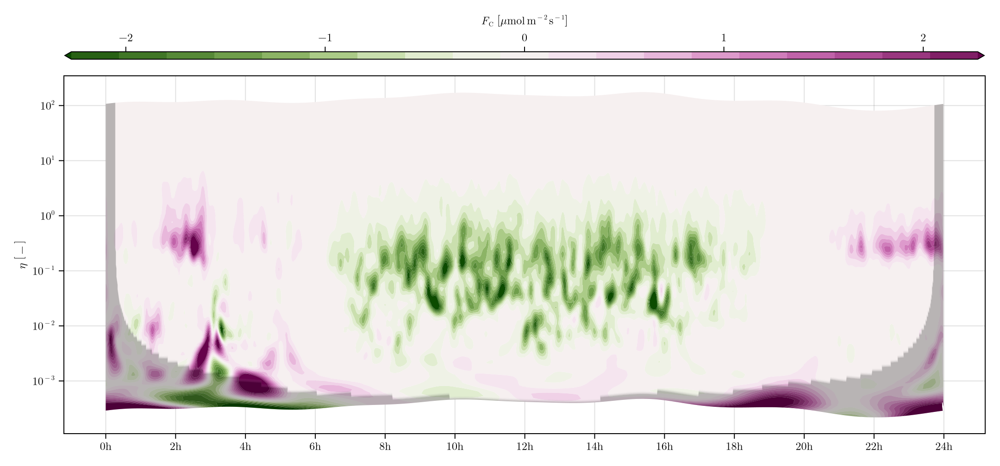

In [38]:
fig = Figure()
σ_F = std(decomp_CO2)
plot_time_eddyscale!(
    fig,
    t,
    η,
    decomp_CO2,
    ;xticks,xtickformat,
    label_z=getlabel(:FC),
    vmin = -4*σ_F,
    vmax = 4*σ_F,
    mask = mask_σ_t,
    xlabel="",title = "",tri=tri,
    )
fig

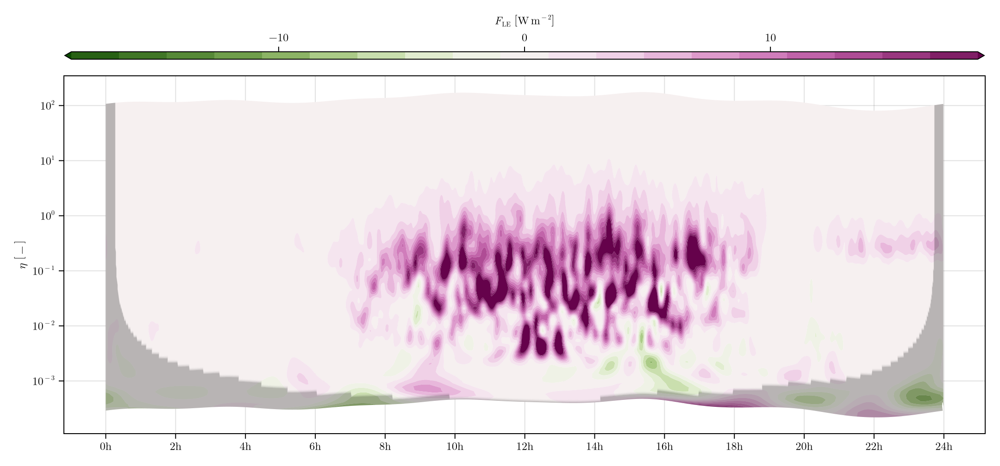

In [39]:
fig = Figure()
σ_F = std(decomp_H2O)
plot_time_eddyscale!(
    fig,
    t,
    η,
    decomp_H2O,
        ;xticks,xtickformat,
    label_z = getlabel(:LatentHeat),
    vmin = -4*σ_F,
    vmax = 4*σ_F,
    mask = mask_σ_t,
    xlabel="",title = "",tri=tri,
)
fig

#### **Naive estimation of time resolved fluxes given time-frequency decomposed fluxes**

In [40]:
SD = size(mask_nomean) .- (0,1)
F_T_nomean=time_integrate_flux(reshape(decomp_T,SD),reshape(mask_nomean[mask_nomean],SD))
F_H2O_nomean=time_integrate_flux(reshape(decomp_H2O,SD),reshape(mask_nomean[mask_nomean],SD))
F_CO2_nomean = time_integrate_flux(reshape(decomp_CO2,SD),reshape(mask_nomean[mask_nomean],SD));

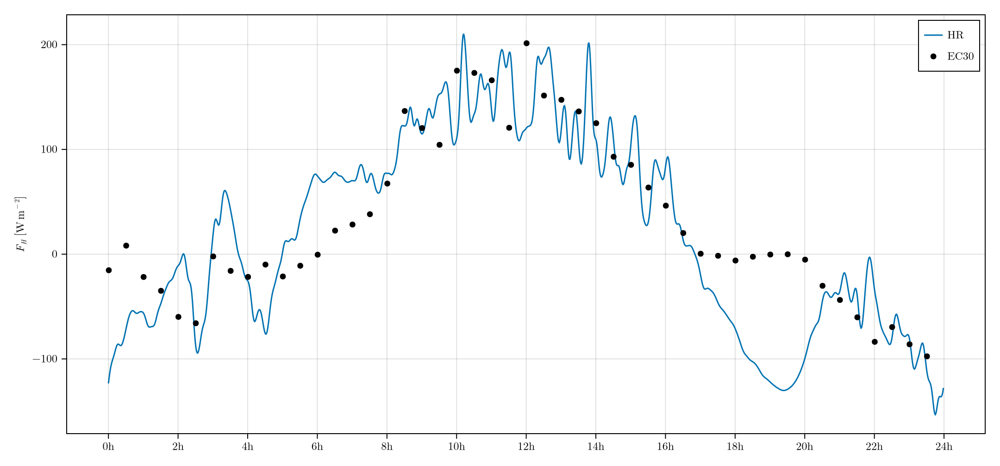

In [41]:
fig=Figure()
ax=Axis(fig[1,1],ylabel=getlabel(:SensibleHeat),xticks=xticks,xtickformat=xtickformat)
lines!(ax,time_h[time_sampling],F_T_nomean,label=label_flux_noturb)
scatter!(ax,time_EP,H_UNCORR,color=color_ref,label=label_eddycov30_nou)
axislegend(ax)
fig

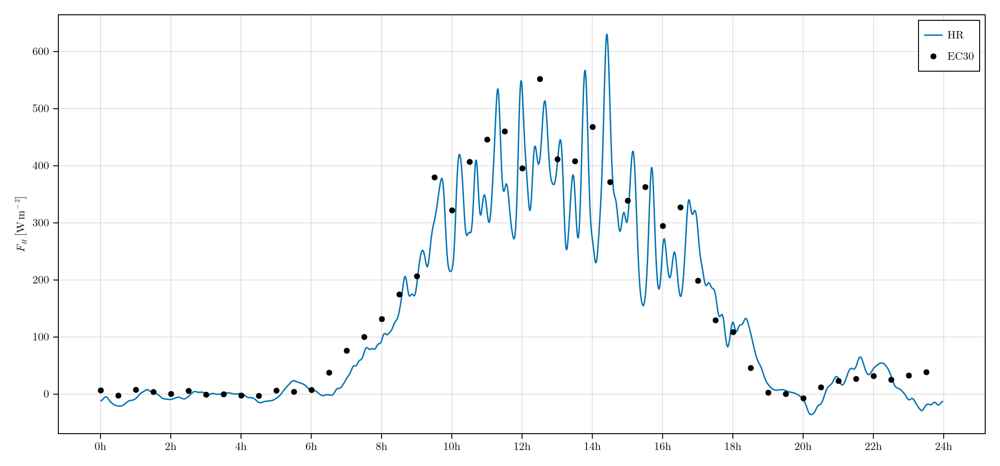

In [42]:
fig=Figure()
ax=Axis(fig[1,1],ylabel=getlabel(:SensibleHeat),xticks=xticks,xtickformat=xtickformat)
lines!(ax,time_h[time_sampling],F_H2O_nomean,label=label_flux_noturb)
scatter!(ax,time_EP,LE_UNCORR,color=color_ref,label=label_eddycov30_nou)
axislegend(ax)
fig

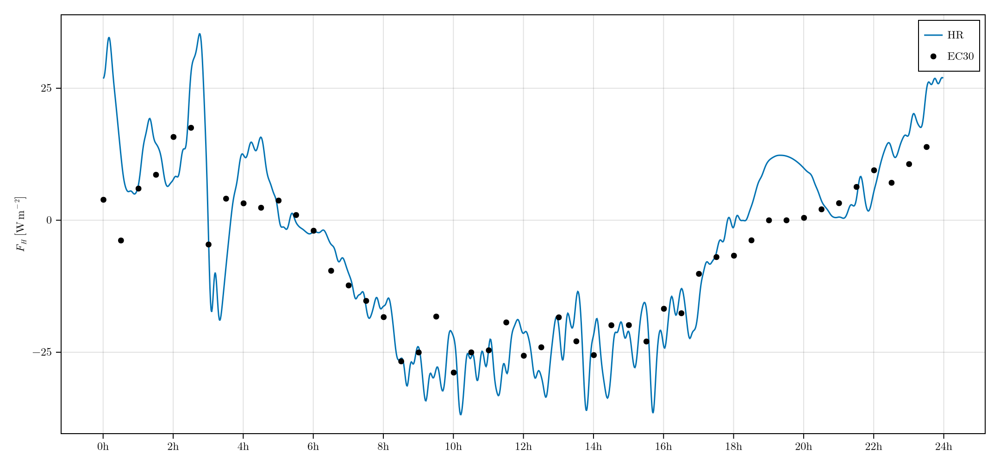

In [43]:
fig=Figure()
ax=Axis(fig[1,1],ylabel=getlabel(:SensibleHeat),xticks=xticks,xtickformat=xtickformat)
lines!(ax,time_h[time_sampling],F_CO2_nomean,label=label_flux_noturb)
scatter!(ax,time_EP,FC_UNCORR,color=color_ref,label=label_eddycov30_nou)
axislegend(ax)
fig

## **Turbulence analysis**

### **the $\tau_w$ metric**
The amplitude of the vertical component of the Reynold's tensor decomposed in time-scale space is
$$
\tau_w(t,\eta)=\sqrt{F_u(t,\eta)^2 + F_v(t,\eta)^2 + F_w(t,\eta)^2}
$$
where $F_u(t,\eta)^2$ is the decomposition of the covariance of $w$ and $u$ in time-scale space.

The idea is to identify which time-frequency regions contribue the most in the vertical stress applied on the measured volume of air.


In [44]:
time_params_turbu = (
    kernel_type = :gaussian, # Gaussian type kernel
    kernel_dim,
    kernel_params = [30*Δt/kernel_dim], # Ratio of max time support. 
    Δt,       # time sampling
    );
_,_,τ_w = amplitude_reynolds_w(U,V,W,time_params_turbu,scale_params);
Z=log10.(τ_w);
Z=Z[mask_nomean];

#### **Visualisation of $\tau_w$**

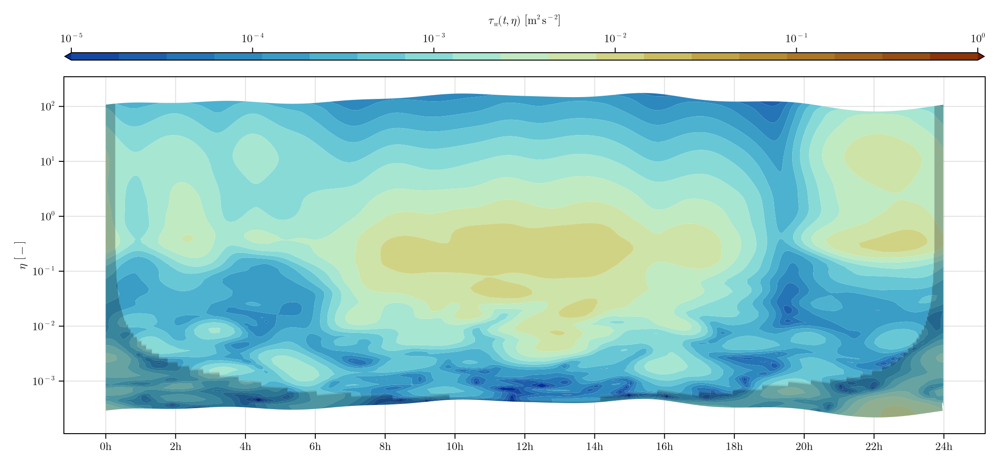

In [45]:
fig = Figure()
plot_time_eddyscale!(
        fig,
        t,
        η,
        Z;
        vmin=-5,
        vmax=0,
        mask = mask_σ_t,
    label_z=getlabel(:tau),
        ticks = LogTicks(round(Int, -5):round(Int, 0)),
        tickformat = log10_format,
        colormap = cmap_tau,
    tri=tri,
    xlabel="",xticks,xtickformat
)
fig

#### **Simple Thresholding of $\tau_w$**

In [46]:
threshold=1e-3
mask_thresh= turbu_extract_threshold(τ_w;threshold=threshold);
mask_thresh=mask_thresh[mask_nomean]
mask_thresh = mask_thresh .&& (.!mask_σ_t); # Remove border errors

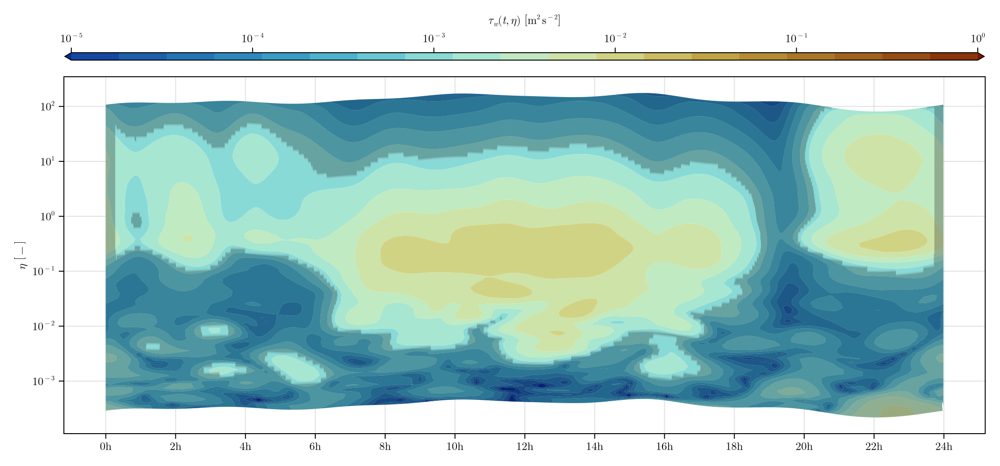

In [47]:
fig = Figure()
plot_time_eddyscale!(
        fig,
        t,
        η,
        Z;
        vmin=-5,
        vmax=0,
        mask = .!mask_thresh,
    label_z=getlabel(:tau),
        ticks = LogTicks(round(Int, -5):round(Int, 0)),
        tickformat = log10_format,
        colormap = cmap_tau,
    xticks=xticks,xtickformat,xlabel="",title = "",tri=tri,
)
fig

#### **Effect of the $\tau_w$ thresholding on flux estimation** 

In [48]:
SD = size(mask_nomean) .- (0,1)
F_T_thresh=time_integrate_flux(reshape(decomp_T,SD),reshape(mask_thresh,SD))
F_H2O_thresh=time_integrate_flux(reshape(decomp_H2O,SD),reshape(mask_thresh,SD))
F_CO2_thresh = time_integrate_flux(reshape(decomp_CO2,SD),reshape(mask_thresh,SD));

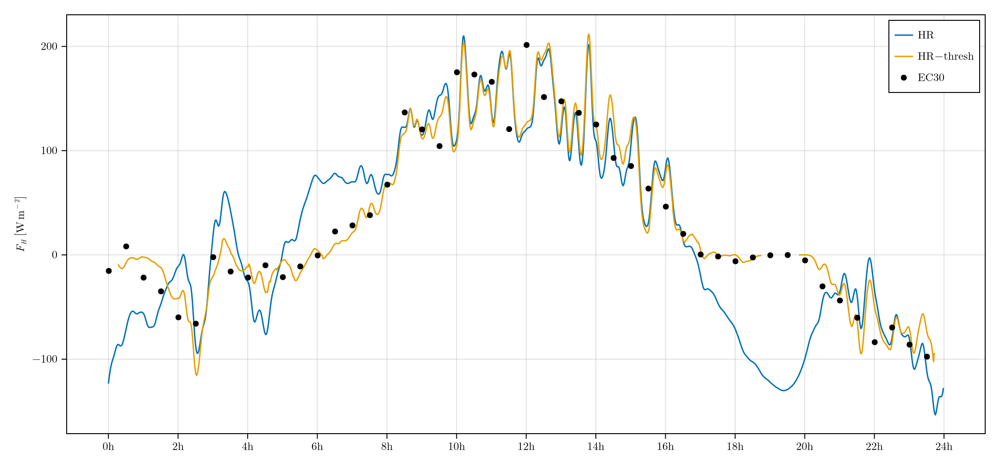

In [49]:
fig=Figure()
ax=Axis(fig[1,1],ylabel=getlabel(:SensibleHeat),xticks=xticks,xtickformat=xtickformat)
lines!(ax,time_h[time_sampling],F_T_nomean,label=label_flux_noturb)
lines!(ax,time_h[time_sampling],F_T_thresh,label=label_flux_thresh)
scatter!(ax,time_EP,H_UNCORR,color=color_ref,label=label_eddycov30_nou)
axislegend(ax)
fig

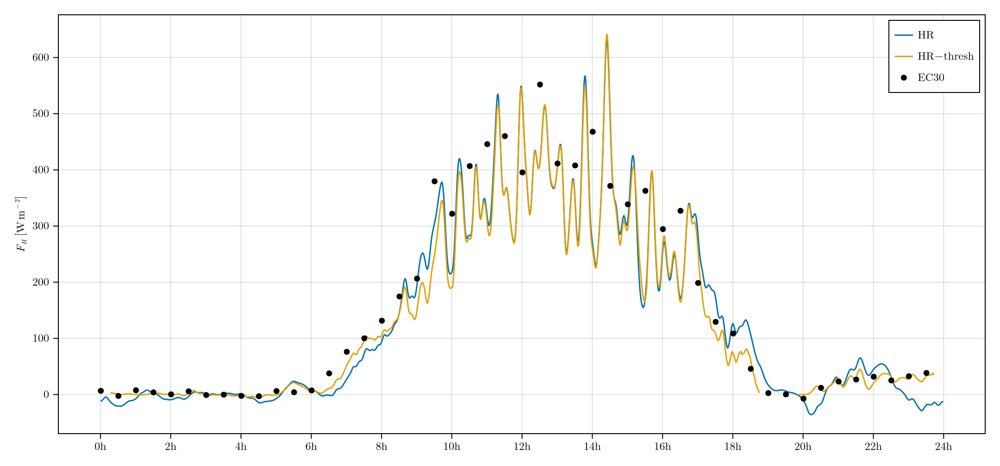

In [50]:
fig=Figure()
ax=Axis(fig[1,1],ylabel=getlabel(:SensibleHeat),xticks=xticks,xtickformat=xtickformat)
lines!(ax,time_h[time_sampling],F_H2O_nomean,label=label_flux_noturb)
lines!(ax,time_h[time_sampling],F_H2O_thresh,label=label_flux_thresh)
scatter!(ax,time_EP,LE_UNCORR,color=color_ref,label=label_eddycov30_nou)
axislegend(ax)
fig

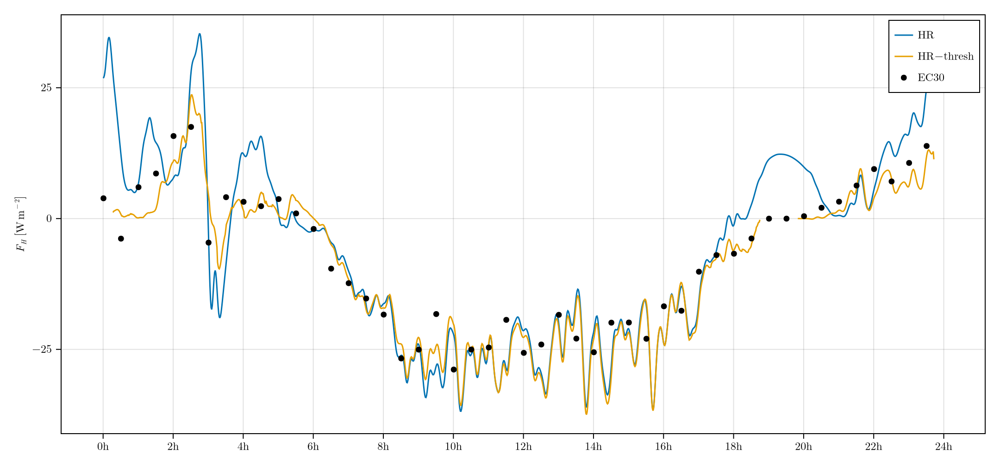

In [51]:
fig=Figure()
ax=Axis(fig[1,1],ylabel=getlabel(:SensibleHeat),xticks=xticks,xtickformat=xtickformat)
lines!(ax,time_h[time_sampling],F_CO2_nomean,label=label_flux_noturb)
lines!(ax,time_h[time_sampling],F_CO2_thresh,label=label_flux_thresh)
scatter!(ax,time_EP,FC_UNCORR,color=color_ref,label=label_eddycov30_nou)
axislegend(ax)
fig

#### **Laplacian Analysis of $\tau_w$**
In regions with random fluctuations, i.e. of instability, we may expect many local minimas and maximax over short displacement in time-scale space. Thus, we look at the laplacian of $\tau_w$ in order to find these regions. In particular, we expect this region to separate the turbulent scales from the meso scales.

In [52]:
(masks,Δτ,itp) = turbu_extract_laplacian(tref,ηref,log10.(τ_w),δ_Δτ=1,δ_τ=1e-3)
mask_minima = masks.minimas[mask_nomean]
mask_advection = masks.advection[mask_nomean]
mask_turbulence = masks.turbulence[mask_nomean]
mask_minima = mask_minima .&& (.!mask_σ_t);
mask_advection = mask_advection .&& (.!mask_σ_t);
mask_turbulence = mask_turbulence .&& (.!mask_σ_t);

We show below the laplcian of $\tau_w$ along with the time varying spectral gap splitting the turbulent scales from the rest.

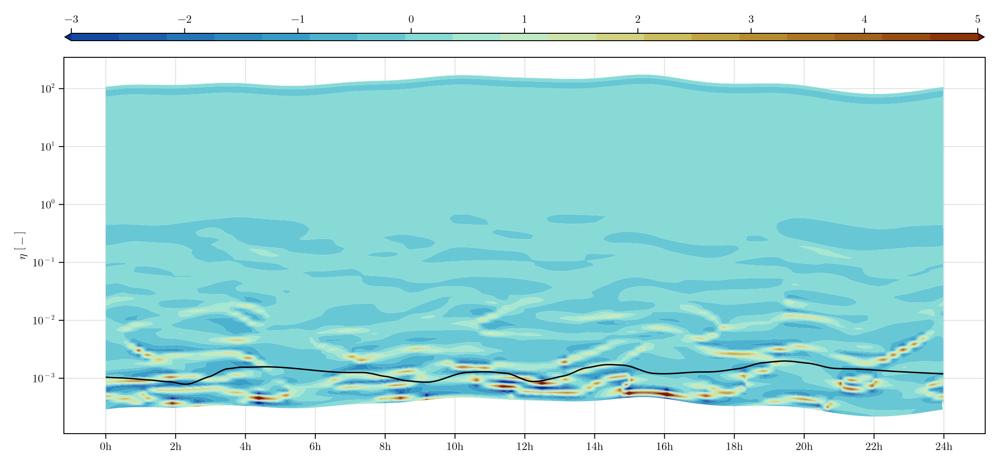

In [53]:
fig = Figure()
ax=plot_time_eddyscale!(
        fig,
        t,
        η,
        Δτ[mask_nomean];xticks,xtickformat,
        vmin=-3,
        vmax=5,        
        colormap = cmap_tau,xlabel="",
    tri=tri,
)
time_varying_spectral_gap = itp.(time_h[time_sampling])
lines!(ax,time_h[time_sampling],time_varying_spectral_gap,color=:black)
fig

#### **Turbulence mask**

The turbulence mask on top of $\tau_w$

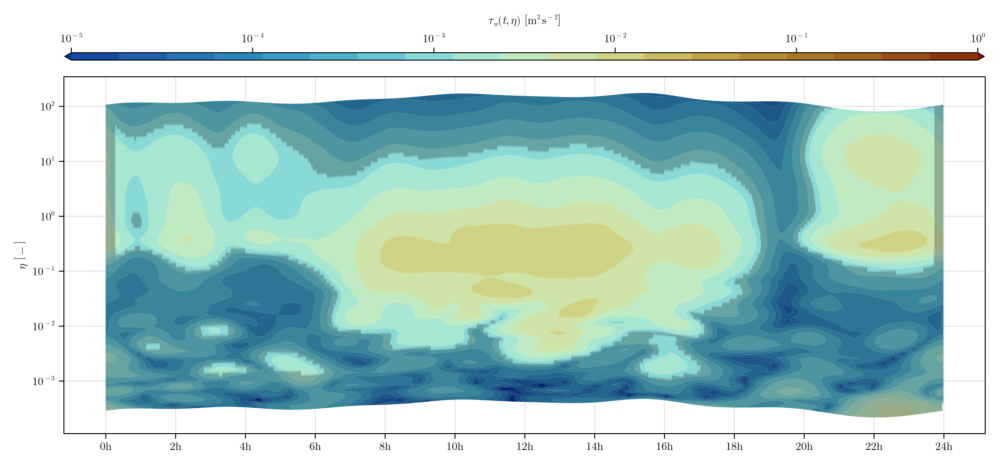

In [54]:
fig = Figure()
ax=plot_time_eddyscale!(
    fig,
        t,
        η,
        Z;
    label_z = getlabel(:tau),
        vmin=-5,
        vmax=0,
        mask = .!mask_turbulence,
        ticks = LogTicks(round(Int, -5):round(Int, 0)),
        tickformat = log10_format,
        colormap = cmap_tau,
    tri=tri,xticks,xtickformat,xlabel="",
)
fig

The turbulence mask on top of the sensible heat flux.

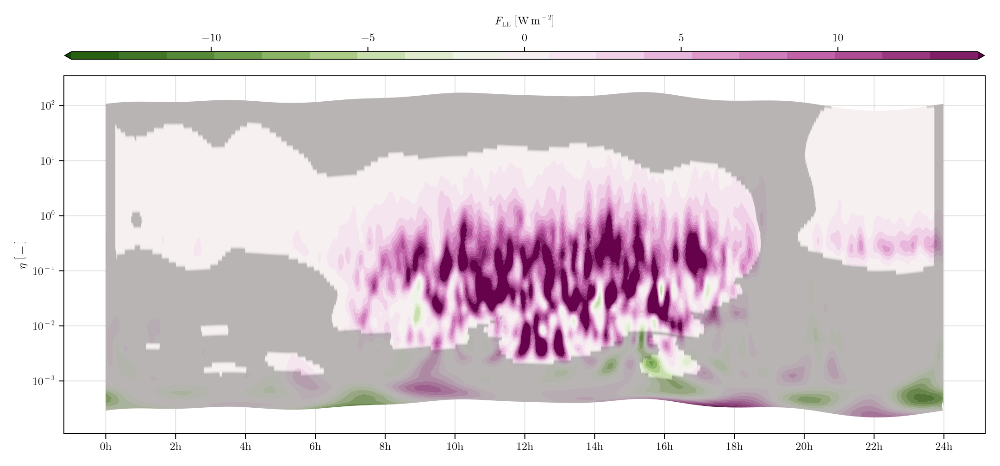

In [55]:
fig = Figure()
σ_F = std(decomp_T)
plot_time_eddyscale!(
    fig,
    t,
    η,
    decomp_H2O,
        ;xticks,xtickformat,
    label_z = getlabel(:LatentHeat),
    vmin = -4*σ_F,
    vmax = 4*σ_F,
    mask = .!mask_turbulence,
    xlabel="",title = "",tri=tri,
)
fig

#### **Effect of the turbulence mask flux estimation** 

In [56]:
F_T_turbu = time_integrate_flux(reshape(decomp_T,SD),reshape(mask_turbulence,SD))
F_H2O_turbu=time_integrate_flux(reshape(decomp_H2O,SD),reshape(mask_turbulence,SD))
F_CO2_turbu=time_integrate_flux(reshape(decomp_CO2,SD),reshape(mask_turbulence,SD));

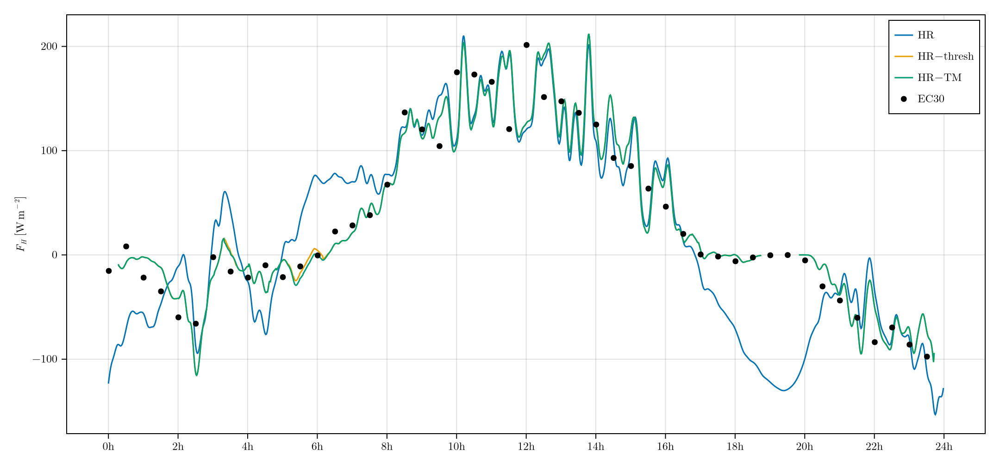

In [57]:
fig=Figure()
ax=Axis(fig[1,1],ylabel=getlabel(:SensibleHeat),xticks=xticks,xtickformat=xtickformat)
lines!(ax,time_h[time_sampling],F_T_nomean,label=label_flux_noturb)
lines!(ax,time_h[time_sampling],F_T_thresh,label=label_flux_thresh)
lines!(ax,time_h[time_sampling],F_T_turbu,label=label_flux_turb)
scatter!(ax,time_EP,H_UNCORR,color=color_ref,label=label_eddycov30_nou)
axislegend(ax)
fig

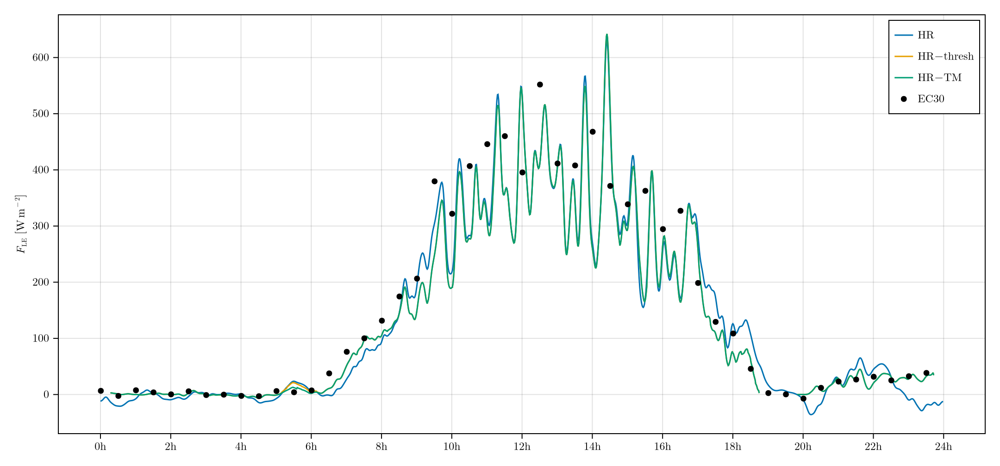

In [58]:
fig=Figure()
ax=Axis(fig[1,1],ylabel=getlabel(:LatentHeat),xticks=xticks,xtickformat=xtickformat)
lines!(ax,time_h[time_sampling],F_H2O_nomean,label=label_flux_noturb)
lines!(ax,time_h[time_sampling],F_H2O_thresh,label=label_flux_thresh)
lines!(ax,time_h[time_sampling],F_H2O_turbu,label=label_flux_turb)
scatter!(ax,time_EP,LE_UNCORR,color=color_ref,label=label_eddycov30_nou)
axislegend(ax)
fig

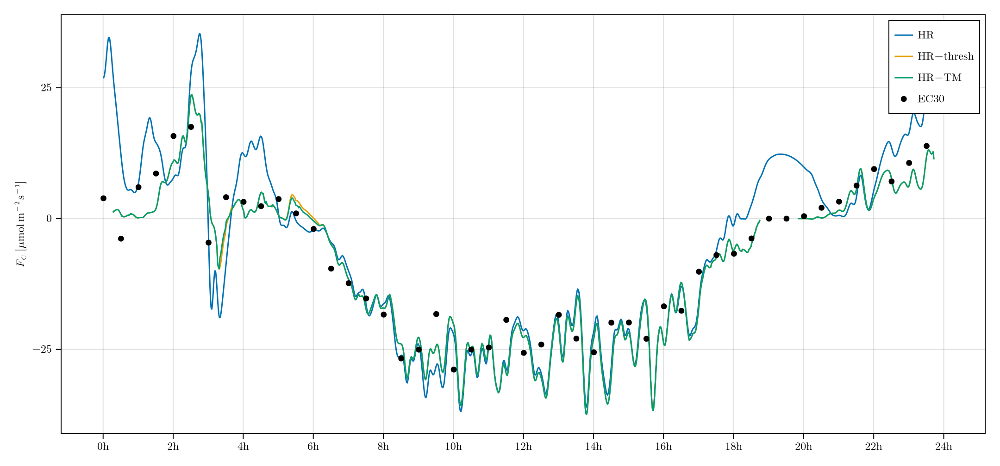

In [59]:
fig=Figure()
ax=Axis(fig[1,1],ylabel=getlabel(:FC),xticks=xticks,xtickformat=xtickformat)
lines!(ax,time_h[time_sampling],F_CO2_nomean,label=label_flux_noturb)
lines!(ax,time_h[time_sampling],F_CO2_thresh,label=label_flux_thresh)
lines!(ax,time_h[time_sampling],F_CO2_turbu,label=label_flux_turb)
scatter!(ax,time_EP,FC_UNCORR,color=color_ref,label=label_eddycov30_nou)
axislegend(ax)
fig